<a href="https://colab.research.google.com/github/hoangnhutsp/CS114.K21/blob/master/DoAnCuoiKy_MachineLearning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# BÀI TOÁN NHẬN DIỆN KHUÔN MẶT

Mô tả bài toán: Nhận diện khuôn mặt là một vấn đề rất quan trọng trong cuộc sống hiện đại, như việc nhận diện khuôn mặt trong các thiết bị đi động, hay trên laptop nhằm kiểm tra danh tính của người dùng. Do đó, việc phát triển, xây dựng cũng như mở rộng vấn đề là một điều vô cùng quan trọng.

Hiện nay có rất nhiều kỹ thuật để thực hiện việc nhận dạng khuôn mặt, tuy nhiên trong phạm vi khả năng. Ta sẽ thực hiện dựa trên trên 3 bước:
1. Xác định và lấy ra khuôn mặt có trong hình ảnh.
2. Từ hình ảnh các khuôn mặt lấy ra từ bước 1, thực hiện việc phân tích, trích xuất các đặt trưng của khuôn mặt.
3. Từ các thông tin có được sau khi phân tích, kết luận và xác minh danh tính người dùng.



**INPUT**: Hình ảnh.

**OUTPUT**: Nhận diện danh tính của khuôn mặt có trong ảnh, bao gồm một trong 4 nhân vật trong bộ dữ liệu train.

SINH VIÊN THỰC HIỆN: ***TRANG HOÀNG NHỰT***

MSSV: ***18520123***

Lớp: ***CS114.K21***






# Quá trình thu thập DATA
- Bộ dữ liệu được lấy từ **internet, google hình ảnh** qua extension: ***Download All Images***.

- Ngoài ra, để được những khuôn mặt thẳng. Ta sẽ trích xuất hình ảnh qua videos.

- Bộ dữ liệu trong thư mục *img_train* phải chỉ có duy nhất một khuôn mặt. Để xử lý và xuất ra khuôn mặt dùng để phân tích những đặc điểm đặc trưng chính xác.


# Tải tất cả data cần thiết cho quá trình xử lý

Tất cả dữ liệu được lưu ở github: https://github.com/hoangnhutsp/DATA_DOAN.git, bao gồm: 
+ Dữ liệu hình ảnh dùng cho việc train và test models.
+ Model nhận diện 68 điểm trên khuôn mặt.
+ Class Align giúp căn chỉnh lại khuôn mặt giúp quá trình nhận diện được chính xác hơn.
+ Model nn4.smakk2.v1.h5



In [1]:
!git clone https://github.com/hoangnhutsp/DATA_DOAN.git

Cloning into 'DATA_DOAN'...
remote: Enumerating objects: 69, done.
remote: Counting objects: 100% (69/69), done.
remote: Compressing objects: 100% (62/62), done.
remote: Total 554 (delta 7), reused 66 (delta 6), pack-reused 485
Receiving objects: 100% (554/554), 897.31 MiB | 15.85 MiB/s, done.
Resolving deltas: 100% (24/24), done.
Checking out files: 100% (438/438), done.


In [2]:
%cd DATA_DOAN/

/content/DATA_DOAN


#2. Import thư viện cho toàn bộ quá trình xử lý


In [3]:
import cv2
import glob
import pandas as pd
from imageio import imread,imsave
from skimage.transform import resize
from tqdm import tqdm
import dlib
from google.colab.patches import cv2_imshow
import numpy as np
import os
import matplotlib.pyplot as plt
from scipy.spatial import distance
from keras.models import load_model
from model import create_model
from align import AlignDlib
import glob
import imutils
from skimage import io
import cv2 as cv


#Bộ dữ liệu train



Số lượng ảnh của mỗi người trong bộ dữ liệu **train** gồm 20 ảnh trên một người.

Với mỗi hình ảnh trong bộ dư liệu chỉ chứa duy nhất một khuôn mặt.
 
Cấu trúc dữ liệu **train** trong thư mục img_train:

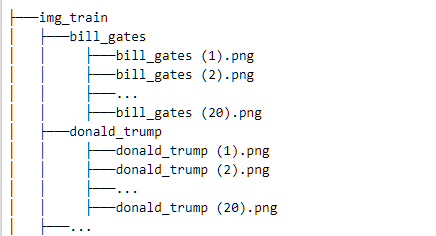

In [4]:
_path = 'show/path_train.PNG'
_img = imread(_path)
cv2_imshow(_img)

Xây dựng bảng DataFrame, chứa bảng gồm 3 cột ***image***, ***label*** và ***name*** chứa tất cả thông tin trong folder **img_train**

In [5]:
train_paths = glob.glob("img_train/*")

df_train = pd.DataFrame(columns=['image', 'label', 'name'])

for i,train_path in tqdm(enumerate(train_paths)):
    name = train_path.split("/")[-1]
    images = glob.glob(train_path + "/*")
    for image in images:
        df_train.loc[len(df_train)]=[image,i,name]

4it [00:00, 10.72it/s]


In [6]:
print(df_train)

                                                image label             name
0   img_train/mark_zuckerberg/mark_zuckerberg (7).png     0  mark_zuckerberg
1   img_train/mark_zuckerberg/mark_zuckerberg (9).png     0  mark_zuckerberg
2   img_train/mark_zuckerberg/mark_zuckerberg (11)...     0  mark_zuckerberg
3   img_train/mark_zuckerberg/mark_zuckerberg (12)...     0  mark_zuckerberg
4   img_train/mark_zuckerberg/mark_zuckerberg (19)...     0  mark_zuckerberg
..                                                ...   ...              ...
75                     img_train/obama/obama (16).png     3            obama
76                     img_train/obama/obama (18).png     3            obama
77                     img_train/obama/obama (15).png     3            obama
78                      img_train/obama/obama (3).png     3            obama
79                     img_train/obama/obama (17).png     3            obama

[80 rows x 3 columns]


**detectFaceUseHOGSVM()** 
- Xác định khuôn mặt của dlib. Bộ xác định khuôn mặt này chỉ hoạt động chính xác với những khuôn mặt hướng về phía trước, mắt nhìn vào máy ảnh
- Dlib là một chương trình của thư viện OpenCV, xác định khuôn mặt. Xác định khuôn mặt này chỉ hoạt động chính xác với những khuôn mặt hướng về phía trước, mắt nhìn vào máy ảnh.
- Thuật toán mà Dlib sử dụng là HOG (Histogram of Oriented Gradients) và SVM (Support Vector Machine).
- Hàm *detectFaceUseHOGSVM()* xử lý và trả về danh sách khuôn mặt có trong hình ảnh.
  + Truyền vào giá trị ***image***: chứa hình ảnh xử lý.
  + Trả về mảng ***face[ ]*** chứa tất cả các khuôn mặt tìm được trong hình ảnh

In [7]:
def detectFaceUseHOGSVM(image):
    hogFaceDetector = dlib.get_frontal_face_detector()
    faceRects = hogFaceDetector(image, 0)
    faces = []
    
    for faceRect in faceRects:
        x1 = faceRect.left()
        y1 = faceRect.top()
        x2 = faceRect.right()
        y2 = faceRect.bottom()
            
        faces.append((x1,y1,x2,y2))

    return faces

In [8]:
path_demo = "img_train/donald_trump/donald_trump (1).png"
img_demo = imread(path_demo)
img_demo = cv.cvtColor(img_demo, cv.COLOR_BGR2RGB)


Xử lý tất cả hình ảnh trong bộ dữ hình ảnh trong folder ***img_train***. Tìm khuôn mặt trong tất cả các ảnh trong folder ***img_train***, sau đó cắt khuôn mặt và lưu đè lên chính file tương ứng.

In [9]:
for img_path in tqdm(df_train.image):
    image = imread(img_path)
    
    faces = detectFaceUseHOGSVM(image)
    face = faces[0]
    x1 = face[0]
    y1 = face[1]
    x2 = face[2]
    y2 = face[3]

    img_face = image[y1:y2,x1:x2]
    imsave(img_path,img_face)

100%|██████████| 80/80 [01:48<00:00,  1.36s/it]


Ví dụ về ảnh Donald Trump trước và sau khi xử lý.

path: img_train/donald_trump/donald_trump (1).png
Ảnh Donald Trump trước khi xử lý


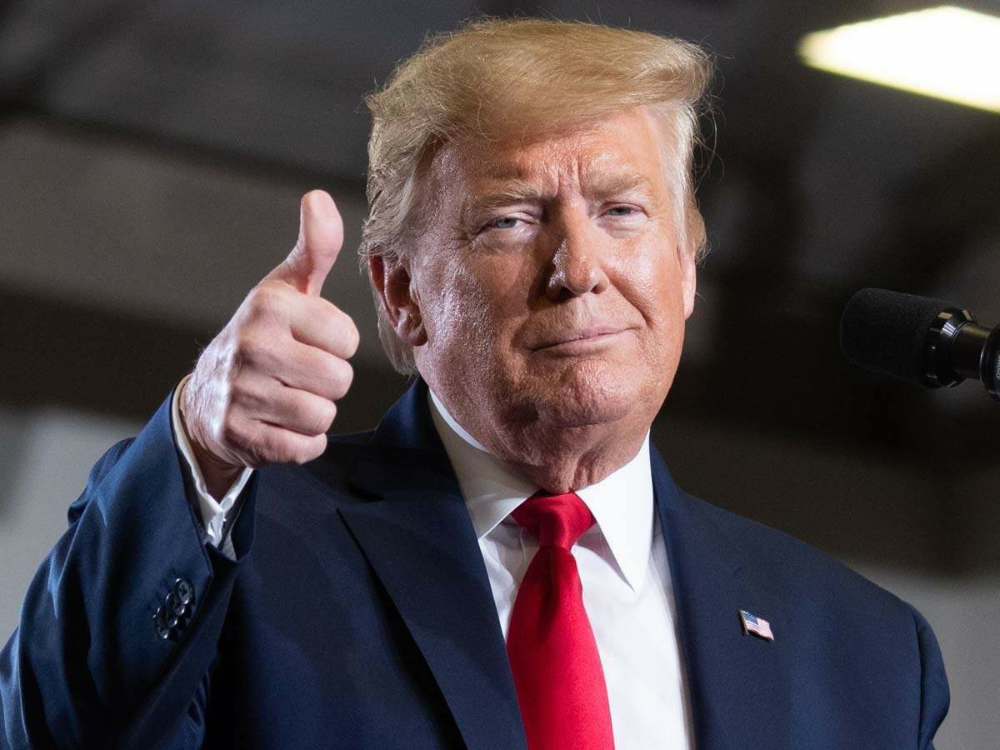

Ảnh Donald Trump sau khi xử lý


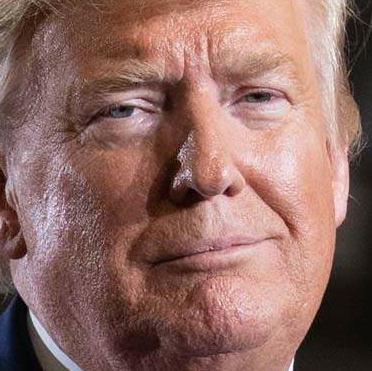

In [11]:
print('path:', path_demo)
img_sol = imread(path_demo)
img_sol = cv.cvtColor(img_sol, cv.COLOR_BGR2RGB)
print('Ảnh Donald Trump trước khi xử lý')
cv2_imshow(img_demo)
print('Ảnh Donald Trump sau khi xử lý')
cv2_imshow(img_sol)

# Xây dựng Models


**Khởi tạo models** cho quá trình xử lý.

Phương pháp nhận diện khuôn mặt sử dụng mạng CNN.

Cấu trúc mang CNN là một lớp Fully Connected 128 phần tử và một lớp L2 normalization, cho phép thu được một embedding vector. Bằng việc so sánh khoảng cách Euclide của các embedding vector của các khuôn mặt.

Do đo, ta có thể xác định được các khuôn mặt đó giống hay khác. 

Ta xác định khoảng cách giửa hai khuôn mặt giống nhau hay khác nhau qua khoảng cách Euclide.

Cấu trúc chi tiết của mạng CNN được định nghĩa trong **model.py**

OpenFace cung cấp pre-trained model được train với bộ dữ liệu [Facescrub](http://vintage.winklerbros.net/facescrub.html) 39 và [CASIA-Webface 30](https://arxiv.org/abs/1411.7923).

**nn4.small2** được train trên tập dữ liệu các khuôn mặt thẳng, do đó các khuôn mặt cần phải được xoay thẳng trước khi sử dụng. 

Ta sử dụng thư viện Dlib để xác định các điểm đặc trưng trên mặt (facial landmarks) và dùng OpenCV để xoay và cắt khuôn mặt thành kích thước 96x96.

Phần tìm điểm đặc trưng và xoay được định nghĩa trong align.py 28. 

Model shape_predictor_68_face_landmarks được sử dụng cho tìm đặc trưng trên khuôn mặt.

In [12]:
nn4_small2 = create_model()

nn4_small2.summary()

nn4_small2.load_weights('weights/nn4.small2.v1.h5')

alignment = AlignDlib('shape_predictor_68_face_landmarks.dat')

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 96, 96, 3)]  0                                            
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, 102, 102, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 48, 48, 64)   9472        zero_padding2d[0][0]             
__________________________________________________________________________________________________
bn1 (BatchNormalization)        (None, 48, 48, 64)   256         conv1[0][0]                      
_______________________________________________________________________________________

Xây dựng các hàm cho quá trình tiền xử lý.

In [13]:
def l2_normalize(x, axis=-1, epsilon=1e-10):
    output = x / np.sqrt(np.maximum(np.sum(np.square(x), axis=axis, keepdims=True), epsilon))
    return output

def align_face(face):
    (h,w,c) = face.shape
    bb = dlib.rectangle(0, 0, w, h)
    return alignment.align(96, face, bb,landmarkIndices=AlignDlib.OUTER_EYES_AND_NOSE)
  
def load_and_align_images(filepaths):
    aligned_images = []
    for filepath in filepaths:
        img = cv2.imread(filepath)
        aligned = align_face(img)
        aligned = (aligned / 255.).astype(np.float32)
        aligned = np.expand_dims(aligned, axis=0)
        aligned_images.append(aligned)
            
    return np.array(aligned_images)
    
def calc_embs(filepaths, batch_size=64):
    pd = []
    for start in tqdm(range(0, len(filepaths), batch_size)):
        aligned_images = load_and_align_images(filepaths[start:start+batch_size])
        pd.append(nn4_small2.predict_on_batch(np.squeeze(aligned_images)))
    embs = np.array(pd)

    return np.array(embs)
    
def align_faces(faces):
    aligned_images = []
    for face in faces:
        aligned = align_face(face)
        aligned = (aligned / 255.).astype(np.float32)
        aligned = np.expand_dims(aligned, axis=0)
        aligned_images.append(aligned)  
    return aligned_images

def calc_emb_test(faces):
    pd = []
    aligned_faces = align_faces(faces)
    if(len(faces)==1):
        pd.append(nn4_small2.predict_on_batch(aligned_faces))
    elif(len(faces)>1):
        pd.append(nn4_small2.predict_on_batch(np.squeeze(aligned_faces)))
    embs = np.array(pd)
    return np.array(embs)

TRAINING MODEL

In [14]:
train_embs = calc_embs(df_train.image)
train_embs = np.concatenate(train_embs)

100%|██████████| 2/2 [00:03<00:00,  1.65s/it]


#Phân tích dữ liệu training

In [15]:
nb_classes = len(train_paths)
label2idx = []
for i in tqdm(range(len(train_paths))):
    label2idx.append(np.asarray(df_train[df_train.label == i].index))

100%|██████████| 4/4 [00:00<00:00, 854.72it/s]


Ta sẽ duyệt lại tất cả những hình ảnh có trong img_train. 

Sau đó ta tính khoảng cách giữa những tấm ảnh cùng loại lưu vào mảng **match[]**, và những ảnh khác loại lưu vào mang **unmatch[]**.


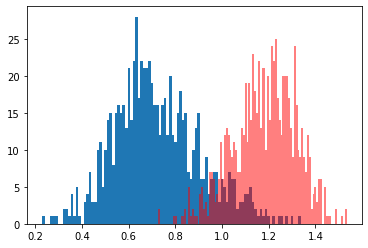

In [16]:
match = []
for i in range(nb_classes):
    ids = label2idx[i]
    distances = []
    for j in range(len(ids) - 1):
        for k in range(j + 1, len(ids)):
            #print('match',j,k)
            distances.append(distance.euclidean(train_embs[ids[j]].reshape(-1), train_embs[ids[k]].reshape(-1)))
    match.extend(distances)
    
unmatch = []
for i in range(nb_classes):
    ids = label2idx[i]
    distances = []
    for j in range(20*10):
        idx = np.random.randint(train_embs.shape[0])
        while idx in label2idx[i]:
            idx = np.random.randint(train_embs.shape[0])
        distances.append(distance.euclidean(train_embs[ids[np.random.randint(len(ids))]].reshape(-1), train_embs[idx].reshape(-1)))
    unmatch.extend(distances)
    
_,_,_=plt.hist(match,bins=100)
_,_,_=plt.hist(unmatch,bins=100,fc=(1, 0, 0, 0.5))

plt.show()


Bảng số liệu sau khi tính toán.
+ Màu xanh thể hiện khoảng cách giửa các khuôn mặt giống nhau.
+ Màu đỏ thể hiện khoảng cách giửa các khuôn mặt khác nhau.

Vì vậy ta chọn khoảng cách threshold = 0.9 là hợp lý để so sánh khoảng cách Euclide giửa các khuôn mặt.
Nếu khoảng cách giửa hai khuôn mặt lớn hơn ngưỡng threshold, suy ra khuôn mặt đang kiểm tra không thuộc trong bộ dữ liệu.

In [17]:
threshold = 0.9

**check()** 
- Kiểm tra có bao nhiêu ảnh có giống với người có tên là ***name*** trong bộ hình ảnh ***test_paths***.
- Truyền vào 2 giá trị: 
  + test_paths: chứa tất cả đường dẫn cần kiễm tra.
  + test_name: tên của người cần kiễm tra.

- Hàm trả về 3 giá trị
  + cnt_correct: số lượng hình ảnh phát hiện ra khuôn mặt, giống với người cần kiễm tra.
  + cnt_uncorrect: số lượng hình ảnh phát hiện ra khuôn mặt, nhưng khác với người cần kiễm tra.
  + cnt_no_face_detection: số lượng hình ảnh không phát hiện ra khuôn mặt.

In [18]:
def check(test_paths, test_name):
    print('name:',test_name)
    cnt_correct = 0
    cnt_uncorrect = 0
    cnt_no_face_detection = 0
    for idx, path in enumerate(test_paths):
        print('PATH: ', path)

        #print('PATH: ', path)
      
        test_image = cv2.imread(path)
        hogFaceDetector = dlib.get_frontal_face_detector()
        faceRects = hogFaceDetector(test_image, 0)
    
        faces = []
    
        for faceRect in faceRects:
            x1 = faceRect.left()
            y1 = faceRect.top()
            x2 = faceRect.right()
            y2 = faceRect.bottom()
            face = test_image[y1:y2,x1:x2]
        
            faces.append(face)

        cnt = 0
        if(len(faces)==0):
            cnt_no_face_detection += 1
        else:    
            test_embs = calc_emb_test(faces)

            test_embs = np.concatenate(test_embs)
        
            people = []
            for i in range(test_embs.shape[0]):
                distances = []
                for j in range(len(train_paths)):
                    distances.append(np.min([distance.euclidean(test_embs[i].reshape(-1), train_embs[k].reshape(-1)) for k in label2idx[j]]))
                if np.min(distances)>threshold:
                    people.append("unknown")
                else:
                    res = np.argsort(distances)[:1]
                    people.append(res)

            names = []
            for p in people:
                if p == "unknown":
                    name = "unknown"
                else:
                    name = df_train[(df_train['label']==p[0])].name.iloc[0]
                names.append(name)

                if (name == test_name):
                    cnt = 1
                break
            cnt_correct += cnt;
            cnt_uncorrect += 1 - cnt;
        if (cnt == 0):
            path_wrong.append(path)
        print(idx, cnt_correct, cnt_uncorrect, cnt_no_face_detection)
    return cnt_correct, cnt_uncorrect, cnt_no_face_detection

**Phân tích bộ dữ liệu traning**

Tạo bảng gồm 3 cột **name**, **correct**, **uncorrect** và **no face detection**
Với mỗi ***name*** chứa thông tin gồm
+ correct: số lượng ảnh có khuôn mặt giống với khuôn mặt có tên
+ uncorrect: số lượng ảnh có khuôn mặt khác với khuôn mặt có tên *name*
+ no face detection: số lượng ảnh có khuôn mặt giống với khuôn mặt có tên *name* 

In [ ]:
path_wrong = []
test_paths = glob.glob("img_test/*")

QQ = pd.DataFrame(columns=['name', 'correct', 'uncorrect', 'no face detection'])

for test_path in test_paths:
    name = test_path.split("/")[-1]
    paths = glob.glob(test_path + "/*")
    
    correct, uncorrect, no_face_detection = check(paths, name)
    QQ.loc[len(QQ)]=[name, correct, uncorrect, no_face_detection]

name: mark_zuckerberg
PATH:  img_test/mark_zuckerberg/mark_zuckerberg (39).png


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:47: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison


0 1 0 0
PATH:  img_test/mark_zuckerberg/mark_zuckerberg (51).png
1 2 0 0
PATH:  img_test/mark_zuckerberg/mark_zuckerberg (79).png
2 3 0 0
PATH:  img_test/mark_zuckerberg/mark_zuckerberg (59).png
3 4 0 0
PATH:  img_test/mark_zuckerberg/mark_zuckerberg (56).png
4 5 0 0
PATH:  img_test/mark_zuckerberg/mark_zuckerberg (7).png
5 6 0 0
PATH:  img_test/mark_zuckerberg/mark_zuckerberg (9).png
6 7 0 0
PATH:  img_test/mark_zuckerberg/mark_zuckerberg (11).png
7 8 0 0
PATH:  img_test/mark_zuckerberg/mark_zuckerberg (12).png
8 9 0 0
PATH:  img_test/mark_zuckerberg/mark_zuckerberg (78).png
9 10 0 0
PATH:  img_test/mark_zuckerberg/mark_zuckerberg (69).png
10 11 0 0
PATH:  img_test/mark_zuckerberg/mark_zuckerberg (47).png
11 12 0 0
PATH:  img_test/mark_zuckerberg/mark_zuckerberg (43).png
12 13 0 0
PATH:  img_test/mark_zuckerberg/mark_zuckerberg (19).png
13 14 0 0
PATH:  img_test/mark_zuckerberg/mark_zuckerberg (29).png
14 15 0 0
PATH:  img_test/mark_zuckerberg/mark_zuckerberg (31).png
15 16 0 0
PATH: 

              name correct uncorrect no face detection
0       bill_gates      77         2                 1
1  mark_zuckerberg      75         0                 5
2     donald_trump      79         0                 1
3            obama      79         1                 0



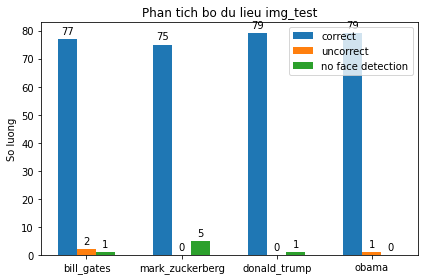

In [ ]:
print(QQ)
print('')

labels = QQ['name']

x = np.arange(len(QQ['name']))  
width = 0.2

fig, ax = plt.subplots()
rects1 = ax.bar(x - width, QQ['correct'], width, label='correct')
rects2 = ax.bar(x, QQ['uncorrect'], width, label='uncorrect')
rects3 = ax.bar(x + width, QQ['no face detection'], width, label='no face detection')

ax.set_ylabel('So luong')
ax.set_title('Phan tich bo du lieu img_test')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()

def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),
                    textcoords="offset points",
                    ha='center', va='bottom')


autolabel(rects1)
autolabel(rects2)
autolabel(rects3)

fig.tight_layout()
plt.show()


#Kiểm tra hình ảnh trong thư mục test

test/img (9).jpg
ANS
mark_zuckerberg
bill_gates


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:44: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison


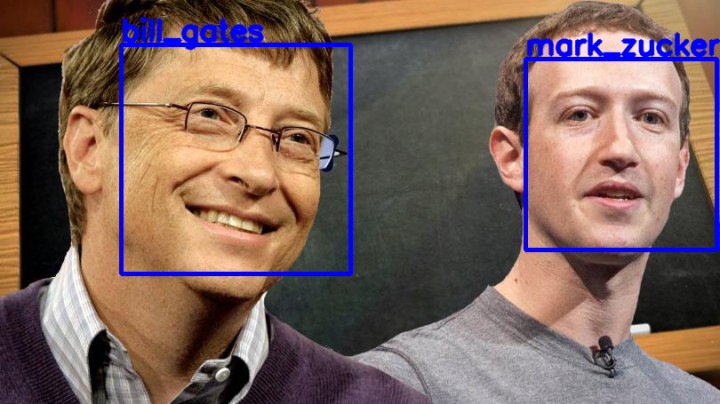

test/img (4).jpg
ANS
donald_trump
obama


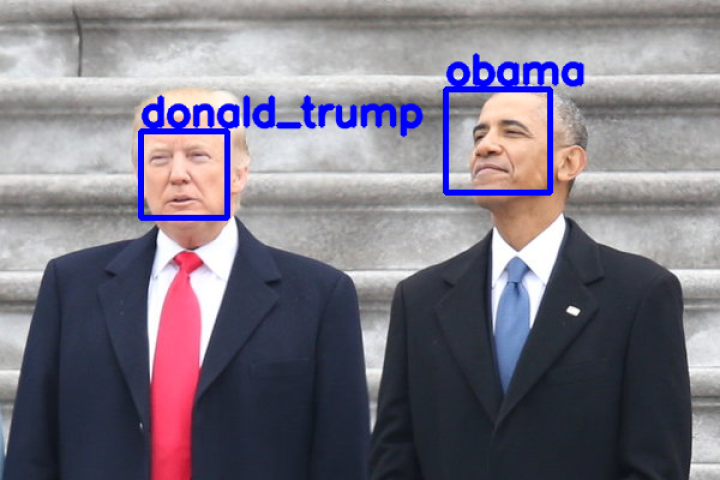

test/img (1).jpg
ANS
mark_zuckerberg
bill_gates
bill_gates


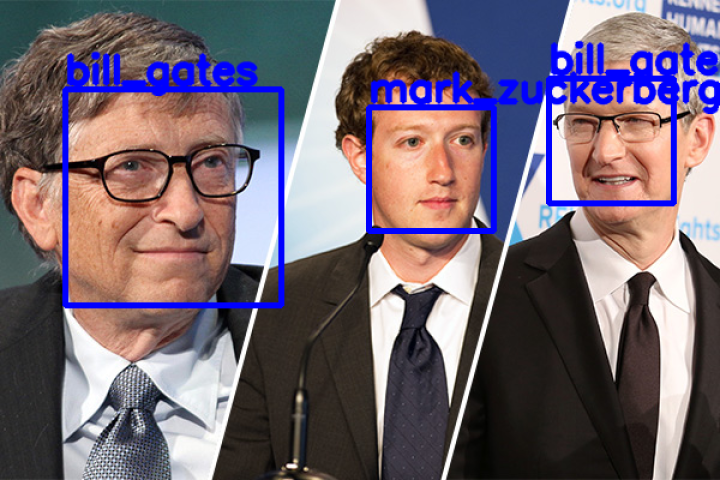

test/img (2).jpg
ANS
obama
donald_trump


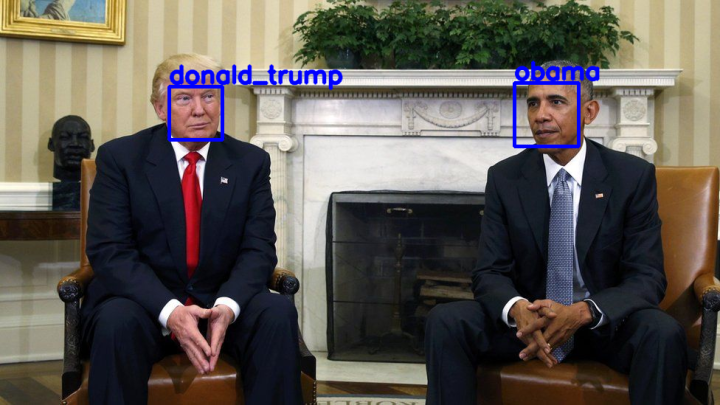

test/img (7).jpg
ANS
mark_zuckerberg
bill_gates


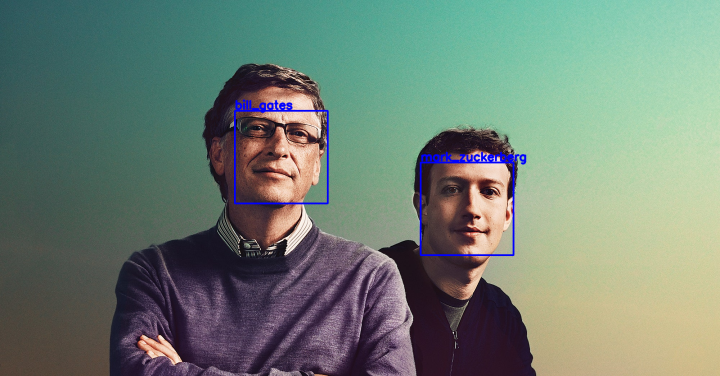

test/img (8).jpg
ANS
mark_zuckerberg
unknown


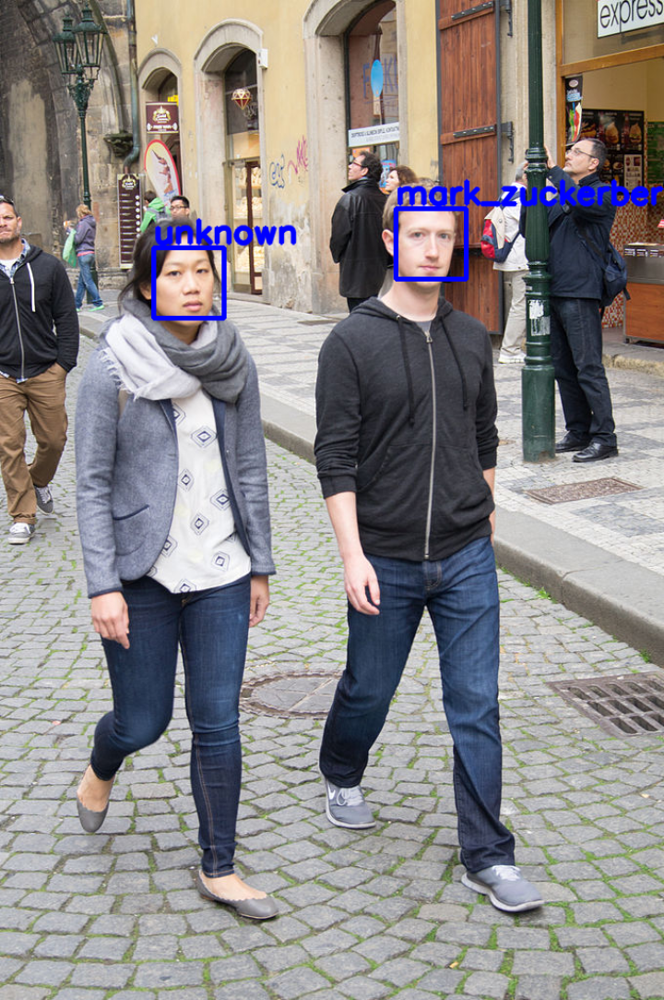

test/img (5).jpg
ANS
mark_zuckerberg
obama
unknown


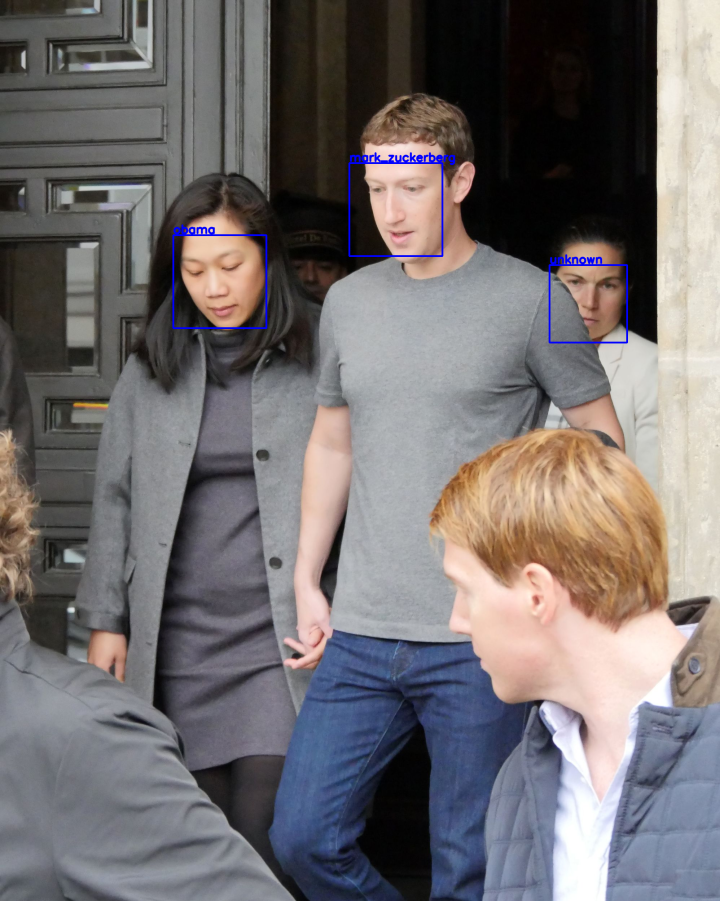

test/img (6).jpg
ANS
obama
unknown


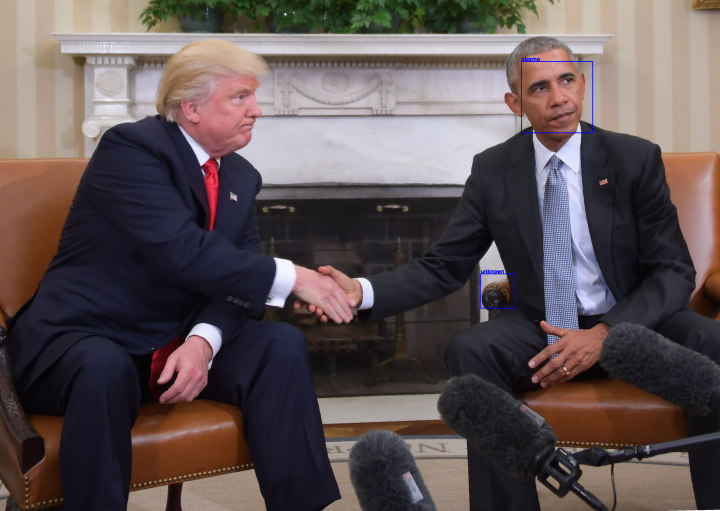

test/img (3).jpg
ANS
obama
mark_zuckerberg


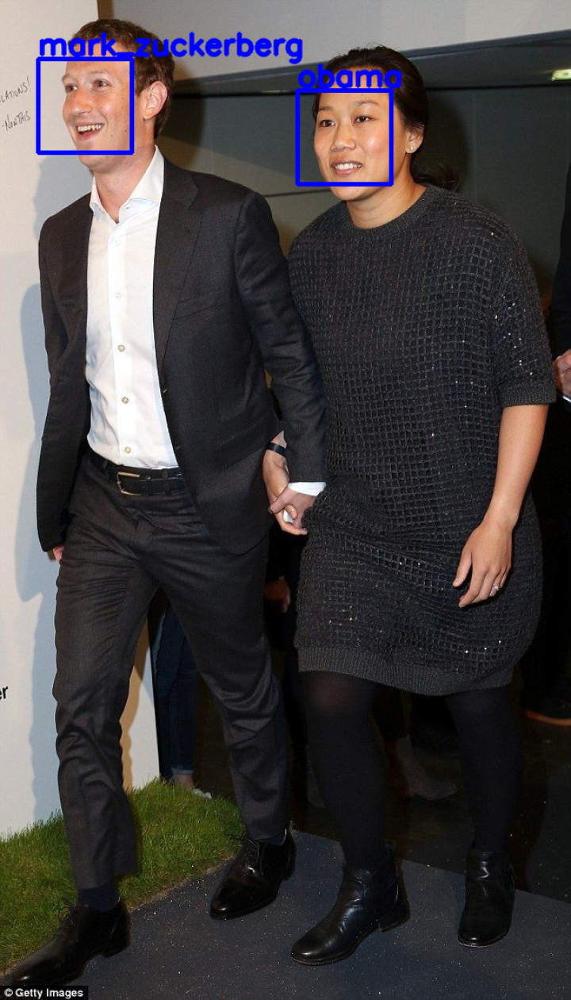

In [ ]:
test_paths = glob.glob("test/*")
for path in test_paths:
    print(path)
    print('ANS')
    test_image = cv2.imread(path)
    show_image = test_image.copy()

    hogFaceDetector = dlib.get_frontal_face_detector()
    faceRects = hogFaceDetector(test_image, 0)
    
    faces = []
    
    for faceRect in faceRects:
        x1 = faceRect.left()
        y1 = faceRect.top()
        x2 = faceRect.right()
        y2 = faceRect.bottom()
        face = test_image[y1:y2,x1:x2]
        
        faces.append(face)

    if(len(faces)==0):
        print("no face detected!")
        continue
    else:    
        test_embs = calc_emb_test(faces)

    test_embs = np.concatenate(test_embs)
        
    people = []
    for i in range(test_embs.shape[0]):
        distances = []
        for j in range(len(train_paths)):
            distances.append(np.min([distance.euclidean(test_embs[i].reshape(-1), train_embs[k].reshape(-1)) for k in label2idx[j]]))
        if np.min(distances)>threshold:
            people.append("unknown")
        else:
            res = np.argsort(distances)[:1]
            people.append(res)

    names = []
    title = ""
    for p in people:
        if p == "unknown":
            name = "unknown"
        else:
            name = df_train[(df_train['label']==p[0])].name.iloc[0]
        names.append(name)
        title = title + name + " "
        
    for i,faceRect in enumerate(faceRects):
        print(names[i])
        x1 = faceRect.left()
        y1 = faceRect.top()
        x2 = faceRect.right()
        y2 = faceRect.bottom()
        cv2.rectangle(show_image,(x1,y1),(x2,y2),(255,0,0),3)
        cv2.putText(show_image,names[i],(x1,y1-5), cv2.FONT_HERSHEY_SIMPLEX, 1.1,(255,0,0),3,cv2.LINE_AA)
        

    show_image = imutils.resize(show_image,width = 720)   
    cv2_imshow(show_image)
      

#Kiểm tra với url

In [ ]:
def testURL(url):
    url_image = io.imread(url) 
    image_2 = cv.cvtColor(url_image, cv.COLOR_BGR2RGB)
    show_image = image_2.copy()
    cv2_imshow(image_2)
    print('')
    hogFaceDetector = dlib.get_frontal_face_detector()
    faceRects = hogFaceDetector(image_2, 0)
    
    faces = []
    
    for faceRect in faceRects:
        x1 = faceRect.left()
        y1 = faceRect.top()
        x2 = faceRect.right()
        y2 = faceRect.bottom()
        face = image_2[y1:y2,x1:x2]
        
        faces.append(face)

    if(len(faces)==0):
        print("no face detected!")
        return
        
    test_embs = calc_emb_test(faces)
    test_embs = np.concatenate(test_embs)
        
    people = []
    for i in range(test_embs.shape[0]):
        distances = []
        for j in range(len(train_paths)):
            distances.append(np.min([distance.euclidean(test_embs[i].reshape(-1), train_embs[k].reshape(-1)) for k in label2idx[j]]))
        if np.min(distances)>threshold:
            people.append("unknown")
        else:
            res = np.argsort(distances)[:1]
            people.append(res)

    names = []
    for p in people:
        if p == "unknown":
            name = "unknown"
        else:
            name = df_train[(df_train['label']==p[0])].name.iloc[0]
        names.append(name)
        
    for i,faceRect in enumerate(faceRects):
        print(names[i])
        x1 = faceRect.left()
        y1 = faceRect.top()
        x2 = faceRect.right()
        y2 = faceRect.bottom()
        cv2.rectangle(image_2,(x1,y1),(x2,y2),(255,0,0),3)
        cv2.putText(image_2,names[i],(x1,y1-5), cv2.FONT_HERSHEY_SIMPLEX, 1.1,(255,0,0),3,cv2.LINE_AA)

    cv2_imshow(image_2)
      

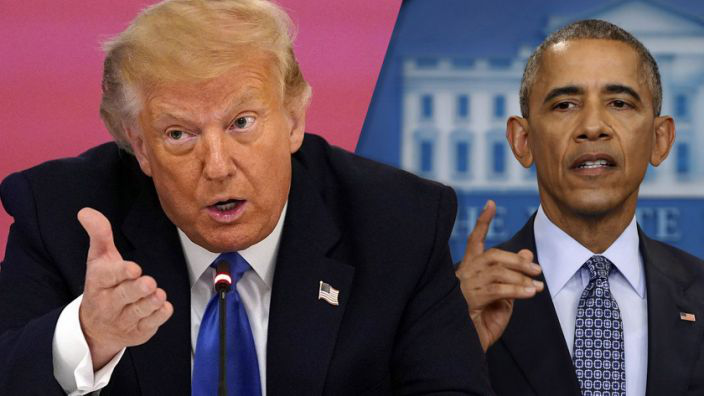


obama
donald_trump


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:41: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison


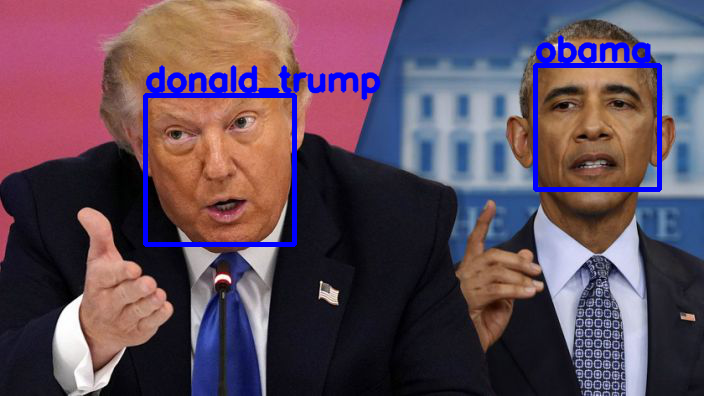

In [ ]:
#@title Input url

url = 'https://s.yimg.com/ny/api/res/1.2/zSqSmZyzi7vHNB3gQvOjpw--/YXBwaWQ9aGlnaGxhbmRlcjt3PTcwNTtoPTM5Ni41NjI1/https://s.yimg.com/uu/api/res/1.2/wDFa9ZWim1rRD_Im4BxpwQ--~B/aD03NTY7dz0xMzQ0O3NtPTE7YXBwaWQ9eXRhY2h5b24-/https://media-mbst-pub-ue1.s3.amazonaws.com/creatr-uploaded-images/2020-07/4254fcb1-c546-11ea-94f7-b0c1b7f35b19' #@param {type:"string"}
testURL(url)

#Nhận xét
1. Kết quả kiễm tra với dữ liệu test đạt kết quả rất tốt. Do bộ ảnh test được lựa chọn kỹ, với khuôn mặt đứng thẳng phù hợp với Model đang sử dụng.
2. Do sử dụng Model ***nn4.small2*** nên việc kiễm tra đúng với hình ảnh gương mặt thẳng là hơn 90%. Những hình ảnh có khuôn mặt nghiên kết quả là *sai* hoặc không tìm được khuôn mặt trong ảnh.
3. Do bộ dữ liệu khá test và train ít, nên kết quả không chính xác hoàn toàn và xảy ra tình trạng ***Overfitting***
4. Trong quá trình train dữ liệu, xảy ra vài lỗi khiến quá trình training không được thực hiện tốt. Như việc sử dụng detectFaceUseHOGSVM() nhiều tấm ảnh nhận diện sai khuôn mặt, khiến cho quá trình phân tích khuôn mặt bị lỗi và ảnh hưởng để quá trình train và test trong những lần đầu. 
5. Trong quá trình test dữ liệu trong thư mục img_test. Một số ảnh xảy ra lỗi, và không tìm được nguyên nhân. Nên hình ảnh trong thư mục hiện tại đã được kiễm tra phù hợp với model và không xảy ra tình trạng lỗi trong quá trình xử lý. 

#Tài liệu tham khảo

- [Image Processing in Python_Final.ipynb](https://colab.research.google.com/github/xn2333/OpenCV/blob/master/Image_Processing_in_Python_Final.ipynb#scrollTo=Tz7UAjxjfMuz)
- [Xây dựng hệ thống kiểm soát nhận dạng khuôn mặt với OpenCV Dlib và Deep Learning](https://topdev.vn/blog/xay-dung-he-thong-kiem-soat-nhan-dang-khuon-mat-voi-opencv-dlib-va-deep-learning/)
- https://github.com/habom2310/face-recognition-with-keras-and-dlib
- [Face recognition với keras, dlib và OpenCV](https://forum.machinelearningcoban.com/t/face-recognition-voi-keras-dlib-va-opencv/4688)